In [1]:
import numpy as np
import pandas as pd 

from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.utils import to_categorical
from keras import regularizers

In [2]:
#fixed random seed for reproducibility 
np.random.seed(0)

In [3]:
# load dataset (input variables = X, output variables = Y)
df = pd.read_csv("2.csv")

#count the number of occurances for each osID
OsID_counts = df['OsID'].value_counts()

#filter for osIDs that have 10 or more occurances
OsID_counts_filtered = OsID_counts[OsID_counts >= 10]

#assign a label for each osID 
OsID_labels = {}
class_no = 0
for osID in OsID_counts_filtered.index:
    OsID_labels[osID] = class_no
    class_no +=1

#filter the dataset with osID that contain 10 or more occurances
dataGene = df[df['OsID'].isin(OsID_counts_filtered.index)]

dataGene = dataGene.drop(['Class', 'Trait'],axis=1)

# Add a new column 'class' to the filtered dataset
dataGene['class'] = dataGene['OsID'].map(OsID_labels)

#print("Summary of dataGene:\n",dataGene.describe())

In [4]:
X = dataGene.drop(['class','OsID'], axis=1) # exclude class & OsID column
Y = dataGene['class']

#input feature names in order of descending importance scores in MI feature selection method
feature_names = ['Root10DaysSeedling', 'Shoot10DaysSeedling', 'Root35DaysSeedling', 'Leaf45DaysOldPlant', 'Shoot35DaysSeedling',
                 'Root14DaysSeedling', 'Root24DaysSeedling', 'Root17DaysSeedling', 'Root21DaysSeedling', 'Shoot3DaysSeedling',
                 'Shoot21DaysSeedling', 'PCC', 'Shoot14DaysSeedling', 'Root52DaysSeedling', 'Shoot17DaysSeedling', 
                 'Leaf21DaysSeedling', 'log_2FoldChange', 'ET', 'PPI', 'CoExpression']

X_fs = X.reindex(columns=feature_names)

print("Shape of X:\n",X_fs.shape)
print("Shape of Y:\n",Y.shape)

# Statistical summary of the variables
#print("Summary of X:\n",X.describe())
#print("Summary of Y:\n",Y.describe())

# Check for class imbalance
print(df.groupby(Y).size())

# change both input and target variables datatype to ndarray

X_fs = X_fs.values # 2-D array

# select target variable 

Y = Y.values #1-D array
Y = Y.reshape(-1, 1)


Shape of X:
 (41110, 20)
Shape of Y:
 (41110,)
class
0.0      1800
1.0      1296
2.0      1260
3.0      1218
4.0      1026
5.0      1008
6.0       930
7.0       912
8.0       880
9.0       798
10.0      792
11.0      759
12.0      729
13.0      720
14.0      702
15.0      693
16.0      672
17.0      640
18.0      625
19.0      570
20.0      546
21.0      506
22.0      483
23.0      448
24.0      432
25.0      384
26.0      360
27.0      360
28.0      320
29.0      312
         ... 
343.0      12
344.0      12
345.0      12
346.0      12
347.0      12
348.0      12
349.0      12
350.0      12
351.0      12
352.0      12
353.0      12
354.0      12
355.0      11
356.0      11
357.0      11
358.0      11
359.0      11
360.0      11
361.0      10
362.0      10
363.0      10
364.0      10
365.0      10
366.0      10
367.0      10
368.0      10
369.0      10
370.0      10
371.0      10
372.0      10
Length: 373, dtype: int64


Class=0, n=1800 (4.378%)
Class=1, n=1296 (3.153%)
Class=2, n=1260 (3.065%)
Class=3, n=1218 (2.963%)
Class=4, n=1026 (2.496%)
Class=5, n=1008 (2.452%)
Class=6, n=930 (2.262%)
Class=7, n=912 (2.218%)
Class=8, n=880 (2.141%)
Class=9, n=798 (1.941%)
Class=10, n=792 (1.927%)
Class=11, n=759 (1.846%)
Class=12, n=729 (1.773%)
Class=13, n=720 (1.751%)
Class=14, n=702 (1.708%)
Class=15, n=693 (1.686%)
Class=16, n=672 (1.635%)
Class=17, n=640 (1.557%)
Class=18, n=625 (1.520%)
Class=19, n=570 (1.387%)
Class=20, n=546 (1.328%)
Class=21, n=506 (1.231%)
Class=22, n=483 (1.175%)
Class=23, n=448 (1.090%)
Class=24, n=432 (1.051%)
Class=25, n=384 (0.934%)
Class=26, n=360 (0.876%)
Class=27, n=360 (0.876%)
Class=28, n=320 (0.778%)
Class=29, n=312 (0.759%)
Class=30, n=312 (0.759%)
Class=31, n=306 (0.744%)
Class=32, n=304 (0.739%)
Class=33, n=299 (0.727%)
Class=34, n=297 (0.722%)
Class=35, n=296 (0.720%)
Class=36, n=280 (0.681%)
Class=37, n=264 (0.642%)
Class=38, n=260 (0.632%)
Class=39, n=253 (0.615%)
Clas

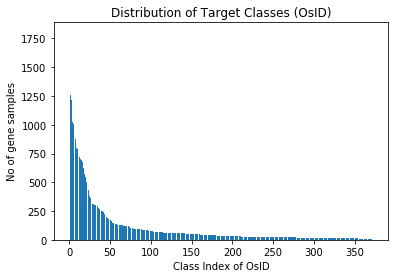

In [5]:
from collections import Counter
# summarize distribution
counter = Counter(Y.flatten())

# sort counter by keys
counter = dict(sorted(counter.items()))

for k,v in counter.items():
 per = v / len(Y.flatten()) * 100
 print('Class=%d, n=%d (%.3f%%)' % (k, v, per))
# plot the distribution
plt.bar( counter.keys(), counter.values())

plt.ylabel('No of gene samples')
plt.xlabel('Class Index of OsID')
plt.title('Distribution of Target Classes (OsID)')
plt.show()

In [6]:
def draw_confusion_matrix(cm):
    plt.figure(figsize=(12,8))
    sns.heatmap(cm,annot=True,fmt="d", center=0, cmap='autumn') 
    plt.title("Confusion Matrix")
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

In [7]:
# prepare target data
def prepare_targets(y_train, y_test):
	le = LabelEncoder()
	
	#fit the encoders only to the training data and then transform both train and test data
	y_train_enc = le.fit_transform(y_train)
	y_test_enc = le.transform(y_test)

	return y_train_enc, y_test_enc

In [8]:
# define baseline model (MLP)
def MLP_model(input_dim):

    model = Sequential()
    model.add(Dense(60, input_dim=input_dim,bias_initializer='normal', activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(20,bias_initializer='normal',activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(20,bias_initializer='normal',activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(373,kernel_initializer='normal', activation='softmax')) #softmax for multi-class classification, num_classes = 373

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    return model

In [9]:
# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_fs, Y, test_size=0.33, random_state=1)

# prepare output data
y_train_enc, y_test_enc = prepare_targets(y_train, y_test)

# Define the number of folds for k-fold cross-validation
k = 2

# Define the cross-validation method
cv_method = StratifiedKFold(n_splits=k)

# Initialize the list to store the history, train & validation(accuracy & loss) for each model
models = []
model_history = []
model_accuracy = []
model_train_acc = []
model_train_loss = []
model_val_acc = []
model_val_loss = []


for i in range(1,21):

    models_fold = []
    hist = []
    train_accuracy = []
    train_loss = []
    val_accuracy = []
    val_loss = []
    test_accuracy = []

    print("Number of input features:",i)

    # Select the input features from the input data
    X_train_selected = X_train[:, :i]
    X_test_selected = X_test[:, :i]

    # Loop over the folds
    for fold, (train_index, val_index) in enumerate(cv_method.split(X_train_selected, y_train)):

        print("Fold:", fold+1)

        # Split the data into train and validation sets using the current fold index
        X_train_fold  = X_train_selected[train_index]
        y_train_fold  = y_train[train_index]
        X_val_fold = X_train_selected[val_index]
        y_val_fold = y_train[val_index]

        # Prepare the target data
        y_train_fold_enc, y_val_fold_enc = prepare_targets(y_train_fold, y_val_fold)

        # build the model
        model = MLP_model(i)

        # Fit the model to the training data for the current fold
        history = model.fit(X_train_fold, to_categorical(y_train_fold_enc, num_classes=373), epochs=100, batch_size=5, verbose=1, validation_split = 0.33)
    
        # Evaluate the model on the validation data for the current fold
        val_scores = model.evaluate(X_val_fold, to_categorical(y_val_fold_enc, num_classes=373), verbose=0)
        val_accuracy.append(val_scores[1])
        val_loss.append(val_scores[0])

        # Evaluate the model on the test data for the current fold
        test_scores = model.evaluate(X_test_selected, to_categorical(y_test_enc, num_classes=373), verbose=0)
        test_accuracy.append(test_scores[1])

        # add the model to the list of models
        models_fold.append(model)
        hist.append(history)

        # store the training accuracy and loss for each fold
        train_accuracy.append(history.history['accuracy'])
        train_loss.append(history.history['loss'])
        
    # Calculate the average test and validation accuracy and loss across all folds
    avg_test_acc = sum(test_accuracy) / len(test_accuracy)
    avg_val_acc = sum(val_accuracy) / len(val_accuracy)
    avg_val_loss = sum(val_loss) / len(val_loss)

    # Print the average validation and test accuracy and loss
    print("Average Validation Accuracy:", avg_val_acc)
    print("Average Validation Loss:",avg_val_loss)
    print("Average Test Accuracy:", avg_test_acc)

    best_fold_index = test_accuracy.index(max(test_accuracy))
    model_accuracy.append(test_accuracy[best_fold_index])
    models.append(models_fold[best_fold_index])
    model_history.append(hist[best_fold_index])
    model_train_acc.append(train_accuracy[best_fold_index])
    model_train_loss.append(train_loss[best_fold_index])
    model_val_acc.append(val_accuracy[best_fold_index])
    model_val_loss.append(val_loss[best_fold_index])


    print("Final Test Accuracy for each fold:", test_accuracy[best_fold_index])

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated i

Number of input features: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/100
1834/1834 [==============================] - 7s 3ms/step - loss: 4.4206 - accuracy: 0.1053 - val_loss: 4.0992 - val_accuracy: 0.1433
Epoch 2/100
1834/1834 [==============================] - 5s 3ms/step - loss: 3.7539 - accuracy: 0.1650 - val_loss: 3.7423 - val_accuracy: 0.2148
Epoch 3/100
1834/1834 [==============================] - 5s 3ms/step - loss: 3.3908 - accuracy: 0.2306 - val_loss: 3.4590 - val_accuracy: 0.2447
Epoch 4/100
1834/1834 [==============================] - 5s 3ms/step - loss: 3.0965 - accuracy: 0.2693 - val_loss: 3.1804 - val_accuracy: 0.2690
Epoch 5/100
1834/1834 [==============================] - 5s 3ms/step - loss: 2.8697 - accuracy: 0.3042 - val_loss: 2.9772 - val_accuracy: 0.3302
Epoch 6/100
1834/1834 [==============================] - 5s 3ms/step - loss: 2.7010 - accuracy: 0.3417 - val_loss: 2.9024 - val_accuracy: 0.3047
Epoch 7/100
1834/1834 [==============================] - 5s 3ms/step - loss: 2.5695 - accuracy: 0.3741 - val_loss: 2.7853 - val_ac

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 13s 4ms/step - loss: 4.0160 - accuracy: 0.2093 - val_loss: 3.3601 - val_accuracy: 0.3253
Epoch 2/100
1834/1834 [==============================] - 7s 4ms/step - loss: 2.7288 - accuracy: 0.4275 - val_loss: 2.6375 - val_accuracy: 0.4918
Epoch 3/100
1834/1834 [==============================] - 6s 3ms/step - loss: 2.1136 - accuracy: 0.5313 - val_loss: 2.2450 - val_accuracy: 0.5277
Epoch 4/100
1834/1834 [==============================] - 7s 4ms/step - loss: 1.7524 - accuracy: 0.5831 - val_loss: 1.9823 - val_accuracy: 0.5640
Epoch 5/100
1834/1834 [==============================] - 7s 4ms/step - loss: 1.5501 - accuracy: 0.6135 - val_loss: 1.7900 - val_accuracy: 0.6187
Epoch 6/100
1834/1834 [==============================] - 7s 4ms/step - loss: 1.4073 - accuracy: 0.6370 - val_loss: 1.7074 - val_accuracy: 0.6154
Epoch 7/100
1834/1834 [==============================] - 7s 4ms/step - loss: 1.3085 - accuracy: 0.6547 - val_loss: 1.6669

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 11s 4ms/step - loss: 3.9459 - accuracy: 0.2234 - val_loss: 3.1544 - val_accuracy: 0.3390
Epoch 2/100
1834/1834 [==============================] - 6s 3ms/step - loss: 2.3722 - accuracy: 0.5258 - val_loss: 2.1377 - val_accuracy: 0.6295
Epoch 3/100
1834/1834 [==============================] - 6s 3ms/step - loss: 1.5595 - accuracy: 0.6655 - val_loss: 1.6018 - val_accuracy: 0.6840
Epoch 4/100
1834/1834 [==============================] - 7s 4ms/step - loss: 1.1387 - accuracy: 0.7326 - val_loss: 1.3078 - val_accuracy: 0.7434
Epoch 5/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.9089 - accuracy: 0.7735 - val_loss: 1.1316 - val_accuracy: 0.7761
Epoch 6/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7680 - accuracy: 0.8003 - val_loss: 1.0202 - val_accuracy: 0.8089
Epoch 7/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.6824 - accuracy: 0.8184 - val_loss: 0.9001

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 13s 4ms/step - loss: 4.0070 - accuracy: 0.2306 - val_loss: 3.0818 - val_accuracy: 0.4453
Epoch 2/100
1834/1834 [==============================] - 7s 4ms/step - loss: 2.2429 - accuracy: 0.5797 - val_loss: 1.9841 - val_accuracy: 0.6585
Epoch 3/100
1834/1834 [==============================] - 7s 4ms/step - loss: 1.4078 - accuracy: 0.7225 - val_loss: 1.4646 - val_accuracy: 0.7248
Epoch 4/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.9561 - accuracy: 0.7925 - val_loss: 1.1270 - val_accuracy: 0.7881
Epoch 5/100
1834/1834 [==============================] - 6s 3ms/step - loss: 0.6933 - accuracy: 0.8407 - val_loss: 0.9093 - val_accuracy: 0.8392
Epoch 6/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5551 - accuracy: 0.8680 - val_loss: 0.7881 - val_accuracy: 0.8536
Epoch 7/100
1834/1834 [==============================] - 6s 4ms/step - loss: 0.4816 - accuracy: 0.8796 - val_loss: 0.7115

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 9s 3ms/step - loss: 3.5546 - accuracy: 0.3587 - val_loss: 2.4256 - val_accuracy: 0.6167
Epoch 2/100
1834/1834 [==============================] - 7s 4ms/step - loss: 1.6510 - accuracy: 0.7009 - val_loss: 1.5682 - val_accuracy: 0.7352
Epoch 3/100
1834/1834 [==============================] - 6s 3ms/step - loss: 1.0096 - accuracy: 0.7995 - val_loss: 1.1026 - val_accuracy: 0.8295
Epoch 4/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7005 - accuracy: 0.8461 - val_loss: 0.8669 - val_accuracy: 0.8552
Epoch 5/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5456 - accuracy: 0.8718 - val_loss: 0.7425 - val_accuracy: 0.8587
Epoch 6/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4586 - accuracy: 0.8889 - val_loss: 0.6316 - val_accuracy: 0.8926
Epoch 7/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4015 - accuracy: 0.8992 - val_loss: 0.5813 

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 13s 5ms/step - loss: 3.5439 - accuracy: 0.3417 - val_loss: 2.4084 - val_accuracy: 0.5764
Epoch 2/100
1834/1834 [==============================] - 7s 4ms/step - loss: 1.5950 - accuracy: 0.6963 - val_loss: 1.4404 - val_accuracy: 0.7396
Epoch 3/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.8930 - accuracy: 0.8119 - val_loss: 0.9547 - val_accuracy: 0.8226
Epoch 4/100
1834/1834 [==============================] - 9s 5ms/step - loss: 0.6159 - accuracy: 0.8563 - val_loss: 0.7745 - val_accuracy: 0.8623
Epoch 5/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4870 - accuracy: 0.8807 - val_loss: 0.6467 - val_accuracy: 0.8636
Epoch 6/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4171 - accuracy: 0.8944 - val_loss: 0.6008 - val_accuracy: 0.8822
Epoch 7/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3675 - accuracy: 0.9063 - val_loss: 0.5246

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/100
1834/1834 [==============================] - 13s 5ms/step - loss: 3.6167 - accuracy: 0.3495 - val_loss: 2.4836 - val_accuracy: 0.5722
Epoch 2/100
1834/1834 [==============================] - 9s 5ms/step - loss: 1.6876 - accuracy: 0.6988 - val_loss: 1.5345 - val_accuracy: 0.7318
Epoch 3/100
1834/1834 [==============================] - 9s 5ms/step - loss: 1.0191 - accuracy: 0.7955 - val_loss: 1.1131 - val_accuracy: 0.8087
Epoch 4/100
1834/1834 [==============================] - 9s 5ms/step - loss: 0.7047 - accuracy: 0.8429 - val_loss: 0.8448 - val_accuracy: 0.8468
Epoch 5/100
1834/1834 [==============================] - 8s 5ms/step - loss: 0.5407 - accuracy: 0.8706 - val_loss: 0.7782 - val_accuracy: 0.8454
Epoch 6/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4580 - accuracy: 0.8873 - val_loss: 0.6398 - val_accuracy: 0.8773
Epoch 7/100
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3979 - accuracy: 0.9021 - val_loss: 0.5973 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 13s 5ms/step - loss: 3.7145 - accuracy: 0.3005 - val_loss: 2.6879 - val_accuracy: 0.5314
Epoch 2/100
1834/1834 [==============================] - 8s 5ms/step - loss: 1.8923 - accuracy: 0.6438 - val_loss: 1.7576 - val_accuracy: 0.6913
Epoch 3/100
1834/1834 [==============================] - 8s 4ms/step - loss: 1.1755 - accuracy: 0.7666 - val_loss: 1.2623 - val_accuracy: 0.7828
Epoch 4/100
1834/1834 [==============================] - 9s 5ms/step - loss: 0.8070 - accuracy: 0.8228 - val_loss: 0.9977 - val_accuracy: 0.8488
Epoch 5/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.6054 - accuracy: 0.8627 - val_loss: 0.8383 - val_accuracy: 0.8669
Epoch 6/100
1834/1834 [==============================] - 9s 5ms/step - loss: 0.4972 - accuracy: 0.8822 - val_loss: 0.7481 - val_accuracy: 0.8614
Epoch 7/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4224 - accuracy: 0.9019 - val_loss: 0.7225

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 13s 5ms/step - loss: 3.4198 - accuracy: 0.3869 - val_loss: 2.2159 - val_accuracy: 0.6180
Epoch 2/100
1834/1834 [==============================] - 9s 5ms/step - loss: 1.5241 - accuracy: 0.7124 - val_loss: 1.3567 - val_accuracy: 0.7471
Epoch 3/100
1834/1834 [==============================] - 9s 5ms/step - loss: 0.9101 - accuracy: 0.8059 - val_loss: 0.9905 - val_accuracy: 0.8089
Epoch 4/100
1834/1834 [==============================] - 9s 5ms/step - loss: 0.6313 - accuracy: 0.8551 - val_loss: 0.7732 - val_accuracy: 0.8605
Epoch 5/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4842 - accuracy: 0.8823 - val_loss: 0.6233 - val_accuracy: 0.8707
Epoch 6/100
1834/1834 [==============================] - 9s 5ms/step - loss: 0.4107 - accuracy: 0.8964 - val_loss: 0.5653 - val_accuracy: 0.9015
Epoch 7/100
1834/1834 [==============================] - 8s 5ms/step - loss: 0.3587 - accuracy: 0.9085 - val_loss: 0.5485

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/100
1834/1834 [==============================] - 14s 5ms/step - loss: 3.5357 - accuracy: 0.3516 - val_loss: 2.4078 - val_accuracy: 0.6052
Epoch 2/100
1834/1834 [==============================] - 9s 5ms/step - loss: 1.5839 - accuracy: 0.7012 - val_loss: 1.4279 - val_accuracy: 0.7586
Epoch 3/100
1834/1834 [==============================] - 8s 5ms/step - loss: 0.9223 - accuracy: 0.8110 - val_loss: 1.0219 - val_accuracy: 0.8142
Epoch 4/100
1834/1834 [==============================] - 9s 5ms/step - loss: 0.6421 - accuracy: 0.8559 - val_loss: 0.8503 - val_accuracy: 0.8492
Epoch 5/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.5105 - accuracy: 0.8773 - val_loss: 0.7228 - val_accuracy: 0.8616
Epoch 6/100
1834/1834 [==============================] - 8s 5ms/step - loss: 0.4321 - accuracy: 0.8939 - val_loss: 0.6122 - val_accuracy: 0.8773
Epoch 7/100
1834/1834 [==============================] - 8s 5ms/step - loss: 0.3790 - accuracy: 0.9066 - val_loss: 0.5689 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 14s 5ms/step - loss: 3.4290 - accuracy: 0.3705 - val_loss: 2.2478 - val_accuracy: 0.6415
Epoch 2/100
1834/1834 [==============================] - 8s 4ms/step - loss: 1.4302 - accuracy: 0.7443 - val_loss: 1.3256 - val_accuracy: 0.7764
Epoch 3/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.8021 - accuracy: 0.8338 - val_loss: 0.8976 - val_accuracy: 0.8432
Epoch 4/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.5530 - accuracy: 0.8717 - val_loss: 0.7477 - val_accuracy: 0.8592
Epoch 5/100
1834/1834 [==============================] - 9s 5ms/step - loss: 0.4377 - accuracy: 0.8935 - val_loss: 0.6146 - val_accuracy: 0.8888
Epoch 6/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3656 - accuracy: 0.9059 - val_loss: 0.5628 - val_accuracy: 0.8926
Epoch 7/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3300 - accuracy: 0.9168 - val_loss: 0.5376

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 13s 5ms/step - loss: 3.5543 - accuracy: 0.3621 - val_loss: 2.4577 - val_accuracy: 0.5932
Epoch 2/100
1834/1834 [==============================] - 9s 5ms/step - loss: 1.6245 - accuracy: 0.7002 - val_loss: 1.4557 - val_accuracy: 0.7411
Epoch 3/100
1834/1834 [==============================] - 8s 5ms/step - loss: 0.9223 - accuracy: 0.8131 - val_loss: 1.0387 - val_accuracy: 0.8235
Epoch 4/100
1834/1834 [==============================] - 9s 5ms/step - loss: 0.6295 - accuracy: 0.8592 - val_loss: 0.8290 - val_accuracy: 0.8620
Epoch 5/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4847 - accuracy: 0.8887 - val_loss: 0.7298 - val_accuracy: 0.8532
Epoch 6/100
1834/1834 [==============================] - 8s 5ms/step - loss: 0.4090 - accuracy: 0.8987 - val_loss: 0.6611 - val_accuracy: 0.8731
Epoch 7/100
1834/1834 [==============================] - 8s 5ms/step - loss: 0.3618 - accuracy: 0.9074 - val_loss: 0.5469

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 11s 4ms/step - loss: 3.3387 - accuracy: 0.3943 - val_loss: 2.1030 - val_accuracy: 0.6205
Epoch 2/100
1834/1834 [==============================] - 7s 4ms/step - loss: 1.3593 - accuracy: 0.7487 - val_loss: 1.2665 - val_accuracy: 0.7520
Epoch 3/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7760 - accuracy: 0.8376 - val_loss: 0.9040 - val_accuracy: 0.8355
Epoch 4/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5439 - accuracy: 0.8746 - val_loss: 0.7425 - val_accuracy: 0.8645
Epoch 5/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4299 - accuracy: 0.8968 - val_loss: 0.6069 - val_accuracy: 0.8917
Epoch 6/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3645 - accuracy: 0.9109 - val_loss: 0.5532 - val_accuracy: 0.9026
Epoch 7/100
1834/1834 [==============================] - 6s 3ms/step - loss: 0.3222 - accuracy: 0.9204 - val_loss: 0.5328

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 10s 4ms/step - loss: 3.4606 - accuracy: 0.3616 - val_loss: 2.2061 - val_accuracy: 0.6395
Epoch 2/100
1834/1834 [==============================] - 8s 4ms/step - loss: 1.3992 - accuracy: 0.7438 - val_loss: 1.2918 - val_accuracy: 0.7958
Epoch 3/100
1834/1834 [==============================] - 9s 5ms/step - loss: 0.7822 - accuracy: 0.8447 - val_loss: 0.9130 - val_accuracy: 0.8519
Epoch 4/100
1834/1834 [==============================] - 6s 4ms/step - loss: 0.5293 - accuracy: 0.8881 - val_loss: 0.7398 - val_accuracy: 0.8782
Epoch 5/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4096 - accuracy: 0.9067 - val_loss: 0.6140 - val_accuracy: 0.8984
Epoch 6/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3404 - accuracy: 0.9206 - val_loss: 0.5359 - val_accuracy: 0.9143
Epoch 7/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2984 - accuracy: 0.9277 - val_loss: 0.5254

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 11s 4ms/step - loss: 3.6448 - accuracy: 0.3155 - val_loss: 2.5209 - val_accuracy: 0.5131
Epoch 2/100
1834/1834 [==============================] - 7s 4ms/step - loss: 1.6989 - accuracy: 0.6850 - val_loss: 1.4973 - val_accuracy: 0.7418
Epoch 3/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.9728 - accuracy: 0.8029 - val_loss: 1.0339 - val_accuracy: 0.8193
Epoch 4/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.6447 - accuracy: 0.8578 - val_loss: 0.8110 - val_accuracy: 0.8523
Epoch 5/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4930 - accuracy: 0.8853 - val_loss: 0.6948 - val_accuracy: 0.8778
Epoch 6/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4011 - accuracy: 0.9023 - val_loss: 0.5706 - val_accuracy: 0.9074
Epoch 7/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3457 - accuracy: 0.9147 - val_loss: 0.5177

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/100
1834/1834 [==============================] - 10s 4ms/step - loss: 3.4290 - accuracy: 0.3783 - val_loss: 2.2208 - val_accuracy: 0.6253
Epoch 2/100
1834/1834 [==============================] - 7s 4ms/step - loss: 1.4473 - accuracy: 0.7347 - val_loss: 1.3618 - val_accuracy: 0.7511
Epoch 3/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8426 - accuracy: 0.8262 - val_loss: 0.9176 - val_accuracy: 0.8523
Epoch 4/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5727 - accuracy: 0.8749 - val_loss: 0.8066 - val_accuracy: 0.8357
Epoch 5/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4302 - accuracy: 0.8967 - val_loss: 0.6561 - val_accuracy: 0.8935
Epoch 6/100
1834/1834 [==============================] - 6s 3ms/step - loss: 0.3540 - accuracy: 0.9146 - val_loss: 0.5664 - val_accuracy: 0.9147
Epoch 7/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3049 - accuracy: 0.9260 - val_loss: 0.5377 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 11s 4ms/step - loss: 3.5457 - accuracy: 0.3589 - val_loss: 2.2101 - val_accuracy: 0.6349
Epoch 2/100
1834/1834 [==============================] - 8s 4ms/step - loss: 1.3962 - accuracy: 0.7467 - val_loss: 1.2427 - val_accuracy: 0.7808
Epoch 3/100
1834/1834 [==============================] - 6s 3ms/step - loss: 0.7430 - accuracy: 0.8508 - val_loss: 0.8623 - val_accuracy: 0.8434
Epoch 4/100
1834/1834 [==============================] - 6s 3ms/step - loss: 0.4798 - accuracy: 0.8896 - val_loss: 0.7427 - val_accuracy: 0.8660
Epoch 5/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3679 - accuracy: 0.9105 - val_loss: 0.5701 - val_accuracy: 0.9050
Epoch 6/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2974 - accuracy: 0.9254 - val_loss: 0.5732 - val_accuracy: 0.8868
Epoch 7/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2676 - accuracy: 0.9341 - val_loss: 0.4554

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/100
1834/1834 [==============================] - 8s 3ms/step - loss: 3.3481 - accuracy: 0.3602 - val_loss: 2.1418 - val_accuracy: 0.6207
Epoch 2/100
1834/1834 [==============================] - 4s 2ms/step - loss: 1.3492 - accuracy: 0.7498 - val_loss: 1.3135 - val_accuracy: 0.7717
Epoch 3/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.7701 - accuracy: 0.8423 - val_loss: 0.8534 - val_accuracy: 0.8702
Epoch 4/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.5036 - accuracy: 0.8940 - val_loss: 0.6810 - val_accuracy: 0.9030
Epoch 5/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.3714 - accuracy: 0.9162 - val_loss: 0.5649 - val_accuracy: 0.9190
Epoch 6/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.3070 - accuracy: 0.9261 - val_loss: 0.5546 - val_accuracy: 0.9130
Epoch 7/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.2623 - accuracy: 0.9392 - val_loss: 0.5096 - val_ac

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/100
1834/1834 [==============================] - 7s 2ms/step - loss: 3.2522 - accuracy: 0.3887 - val_loss: 2.0299 - val_accuracy: 0.6331
Epoch 2/100
1834/1834 [==============================] - 5s 3ms/step - loss: 1.3265 - accuracy: 0.7494 - val_loss: 1.2016 - val_accuracy: 0.8105
Epoch 3/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.7667 - accuracy: 0.8437 - val_loss: 0.8874 - val_accuracy: 0.8446
Epoch 4/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.5142 - accuracy: 0.8857 - val_loss: 0.6863 - val_accuracy: 0.8775
Epoch 5/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.3955 - accuracy: 0.9047 - val_loss: 0.5761 - val_accuracy: 0.9143
Epoch 6/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.3166 - accuracy: 0.9204 - val_loss: 0.5597 - val_accuracy: 0.9103
Epoch 7/100
1834/1834 [==============================] - 4s 2ms/step - loss: 0.2676 - accuracy: 0.9320 - val_loss: 0.4600 

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/100
1834/1834 [==============================] - 12s 5ms/step - loss: 3.4684 - accuracy: 0.3518 - val_loss: 2.2034 - val_accuracy: 0.5791
Epoch 2/100
1834/1834 [==============================] - 9s 5ms/step - loss: 1.3869 - accuracy: 0.7393 - val_loss: 1.2160 - val_accuracy: 0.7850
Epoch 3/100
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7643 - accuracy: 0.8452 - val_loss: 0.8676 - val_accuracy: 0.8326
Epoch 4/100
1834/1834 [==============================] - 8s 5ms/step - loss: 0.4862 - accuracy: 0.8953 - val_loss: 0.6524 - val_accuracy: 0.8897
Epoch 5/100
1834/1834 [==============================] - 6s 3ms/step - loss: 0.3540 - accuracy: 0.9150 - val_loss: 0.5213 - val_accuracy: 0.9054
Epoch 6/100
1834/1834 [==============================] - 8s 4ms/step - loss: 0.2808 - accuracy: 0.9301 - val_loss: 0.4594 - val_accuracy: 0.9214
Epoch 7/100
1834/1834 [==============================] - 6s 4ms/step - loss: 0.2442 - accuracy: 0.9390 - val_loss: 0.4106 - val_a

In [10]:
#to show the no of input features and its corresponding model accuracy
model_list = []

#Iterate through each model's accuracy 
for i in range (len(model_accuracy)):
    #get the number of input features for the current model
    no_features = i + 1

    #round the model accuries to 3 d.p.
    rounded_model_acc = round(model_accuracy[i], 3)
    
    model_list.append([no_features, rounded_model_acc])

models_df = pd.DataFrame(model_list, columns=["No of input features", "Model accuracy"])

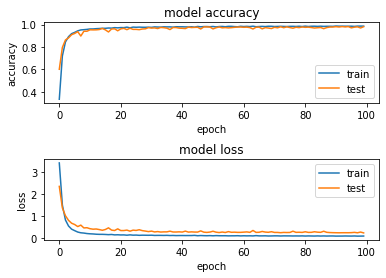

Final Test Accuracy: 0.9887226223945618


In [11]:
# Select the final model based on the max test accuracy across all models

best_model_index = model_accuracy.index(max(model_accuracy))

best_model = models[best_model_index]
best_model_history = model_history[best_model_index]
best_model_train_acc = model_train_acc[best_model_index]
best_model_train_loss = model_train_loss[best_model_index]
best_model_val_acc = model_val_acc[best_model_index]
best_model_val_loss = model_val_loss[best_model_index]

# summarize history for accuracy  
plt.subplot(211)  
plt.plot(best_model_history.history['accuracy'])  
plt.plot(best_model_history.history['val_accuracy'])  
plt.title('model accuracy')  
plt.ylabel('accuracy')  
plt.xlabel('epoch')  
plt.legend(['train', 'test'], loc='lower right')  

# summarize history for loss
plt.subplot(212)  
plt.plot(best_model_history.history['loss'])  
plt.plot(best_model_history.history['val_loss'])  
plt.title('model loss')  
plt.ylabel('loss')  
plt.xlabel('epoch')  
plt.legend(['train', 'test'], loc='upper right')  
plt.subplots_adjust(hspace=0.7)

plt.show() 

print("Final Test Accuracy:", model_accuracy[best_model_index])

In [12]:
#Select only the optimal number of input features for X_test
X_test = X_test[:,:(best_model_index+1)]

# Evaluate the best model on the test data
y_pred = best_model.predict(X_test)

# np.argmax() is used to convert the one-hot encoded predictions and test labels to class labels.
y_pred_label = np.argmax(y_pred, axis = 1)

# Print the classification report
print("Classification report:\n", classification_report(y_test_enc, y_pred_label))


424/424 [==============================] - 2s 3ms/step
Classification report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       591
           1       1.00      1.00      1.00       430
           2       1.00      1.00      1.00       419
           3       1.00      1.00      1.00       384
           4       0.99      1.00      1.00       339
           5       1.00      1.00      1.00       342
           6       1.00      1.00      1.00       310
           7       1.00      1.00      1.00       325
           8       1.00      1.00      1.00       294
           9       1.00      1.00      1.00       269
          10       1.00      1.00      1.00       296
          11       1.00      1.00      1.00       258
          12       1.00      1.00      1.00       247
          13       1.00      1.00      1.00       237
          14       1.00      1.00      1.00       239
          15       1.00      1.00      1.00       235
  

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [13]:
# extract class labels from test data
class_test = y_test_enc

# Invert OsID_labels dictionary
inv_OsID_labels = {v: k for k, v in OsID_labels.items()}

# map OsID values to the class labels
OsID_test = [inv_OsID_labels.get(value, 'Unknown') for value in class_test]

# create dataframe with OsID, true class, predicted class, and true/false columns
results = pd.DataFrame({
    'OsID': OsID_test,
    'True Class': y_test_enc,
    'Predicted Class': y_pred_label,
    'True/False': class_test == y_pred_label
})

# display dataframe
print(results.head())

# save results_df to a CSV file
results.to_csv('MLP_gene classification.csv', index=False)

           OsID  True Class  Predicted Class  True/False
0  Os11g0704500         334              280       False
1  Os09g0279600         161              161        True
2  Os03g0669100          17               17        True
3  Os05g0542500          34               34        True
4  Os09g0522000           7                7        True
